In [1]:
import numpy as np
import requests
from PIL import Image
from urllib.request import urlopen
import matplotlib.pyplot as plt

In [2]:
# Example request: 'https://api.scryfall.com/cards/search?q=c%3Dwhite+cmc%3D1'
def req_wrapper(params):
    cardsSite = "https://api.scryfall.com/cards/search?q="
    req = cardsSite + "+".join([str(k) + "%3D" + str(v) for k,v in params.items()])
    return requests.get(req)

params = {"set" : "c20", "type" : "human"}
r = req_wrapper(params).json()

In [3]:
getimage = lambda data : Image.open(urlopen(data['image_uris']['normal']))

imgLst = [getimage(dataEntry) for dataEntry in r['data']]

imgArr = np.hstack([np.asarray(img) for img in imgLst])
rezImg = Image.fromarray(imgArr)

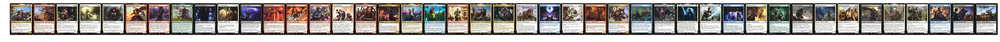

In [4]:
%matplotlib inline
plt.figure(figsize=(2*len(imgLst), 2), dpi=300)
plt.imshow(rezImg)
plt.axis('off')
plt.show()

In [6]:
r.keys()

dict_keys(['object', 'total_cards', 'has_more', 'data'])

In [7]:
r['total_cards']

43

In [12]:
import pandas as pd

In [31]:
importantColumns = ['name', 'mana_cost', 'power', 'toughness', 'rarity', 'set', 'type_line']

In [30]:
r['data'][0][]

'Legendary Creature — Human Knight'

In [28]:
list(r['data'][0].keys())

['object',
 'id',
 'oracle_id',
 'multiverse_ids',
 'tcgplayer_id',
 'name',
 'lang',
 'released_at',
 'uri',
 'scryfall_uri',
 'layout',
 'highres_image',
 'image_uris',
 'mana_cost',
 'cmc',
 'type_line',
 'oracle_text',
 'power',
 'toughness',
 'colors',
 'color_identity',
 'keywords',
 'legalities',
 'games',
 'reserved',
 'foil',
 'nonfoil',
 'oversized',
 'promo',
 'reprint',
 'variation',
 'set',
 'set_name',
 'set_type',
 'set_uri',
 'set_search_uri',
 'scryfall_set_uri',
 'rulings_uri',
 'prints_search_uri',
 'collector_number',
 'digital',
 'rarity',
 'card_back_id',
 'artist',
 'artist_ids',
 'illustration_id',
 'border_color',
 'frame',
 'frame_effects',
 'full_art',
 'textless',
 'booster',
 'story_spotlight',
 'edhrec_rank',
 'prices',
 'related_uris',
 'purchase_uris']

In [32]:
df = pd.DataFrame(r['data'])
df[importantColumns]


,name,mana_cost,power,toughness,rarity,set,type_line
0,"Adriana, Captain of the Guard",{3}{R}{W},4,4,rare,c20,Legendary Creature — Human Knight
1,"Alesha, Who Smiles at Death",{2}{R},3,2,rare,c20,Legendary Creature — Human Warrior
2,Avenging Huntbonder,{3}{W}{W},3,3,rare,c20,Creature — Human Warrior
3,Banisher Priest,{1}{W}{W},2,2,uncommon,c20,Creature — Human Cleric
4,Bounty Agent,{1}{W},2,2,rare,c20,Creature — Human Soldier
5,"Brallin, Skyshark Rider",{3}{R},3,3,mythic,c20,Legendary Creature — Human Shaman
6,Captivating Crew,{3}{R},4,3,rare,c20,Creature — Human Pirate
7,"Cazur, Ruthless Stalker",{3}{G},3,3,mythic,c20,Legendary Creature — Human Warrior
8,Daring Fiendbonder,{3}{B},5,1,rare,c20,Creature — Human Warlock
9,Devout Chaplain,{2}{W},2,2,uncommon,c20,Creature — Human Cleric


In [34]:
list(df.columns)

['all_parts',
 'artist',
 'artist_ids',
 'booster',
 'border_color',
 'card_back_id',
 'cmc',
 'collector_number',
 'color_identity',
 'colors',
 'digital',
 'edhrec_rank',
 'flavor_text',
 'foil',
 'frame',
 'frame_effects',
 'full_art',
 'games',
 'highres_image',
 'id',
 'illustration_id',
 'image_uris',
 'keywords',
 'lang',
 'layout',
 'legalities',
 'mana_cost',
 'mtgo_id',
 'multiverse_ids',
 'name',
 'nonfoil',
 'object',
 'oracle_id',
 'oracle_text',
 'oversized',
 'power',
 'preview',
 'prices',
 'prints_search_uri',
 'promo',
 'purchase_uris',
 'rarity',
 'related_uris',
 'released_at',
 'reprint',
 'reserved',
 'rulings_uri',
 'scryfall_set_uri',
 'scryfall_uri',
 'set',
 'set_name',
 'set_search_uri',
 'set_type',
 'set_uri',
 'story_spotlight',
 'tcgplayer_id',
 'textless',
 'toughness',
 'type_line',
 'uri',
 'variation']